# Desigualdad espacial

In [104]:
%matplotlib inline

import seaborn
import pandas
import geopandas
import pysal
import numpy
import mapclassify
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['figure.figsize'] = 10, 5
pandas.set_option('display.max_columns', None)

Este capítulo utiliza la desigualdad económica para ilustrar cómo el estudio de la evolución de las disparidades sociales puede beneficiarse de un tratamiento explícitamente espacial. La desigualdad social y económica suele estar a la cabeza de las agendas de los responsables políticos. Su estudio siempre ha atraído una atención considerable en los círculos académicos. **Gran parte de la atención se ha centrado en la desigualdad de ingresos interpersonal , sin embargo, existe un creciente reconocimiento de que la cuestión de la desigualdad de ingresos interregional requiere mayor atención**, ya que las crecientes **brechas entre las regiones pobres y ricas se han identificado como impulsores clave de la polarización política** en los países en desarrollo y países desarrollados.

Gran parte del estudio de las desigualdades se ha centrado en el nivel individual: ¿cómo difieren los resultados entre individuos? Este enfoque no agrupa a los individuos geográficamente. En otras palabras, no se preocupa por si esas diferencias siguen un patrón, por ejemplo, a nivel regional (por ejemplo, ¿se encuentra la mayoría de la población más desfavorecida en una sección particular del mapa?). De hecho, si bien las dos literaturas (desigualdad personal y regional) están relacionadas, se han desarrollado de una manera en gran parte paralela con una fertilización cruzada limitada. **En este capítulo, examinamos cómo un enfoque espacialmente explícito puede proporcionar información sobre el estudio de la desigualdad y su dinámica.** Esperamos que esta ilustración pueda ser útil en sí misma pero también inspirar el uso de estos métodos en el estudio de otros fenómenos para los cuales la **perspectiva regional** puede aportar valor a la mesa.

Después de discutir los datos que empleamos, comenzamos con una introducción a los métodos clásicos para el análisis de la desigualdad de ingresos interpersonales y cómo se han adoptado a la cuestión de las desigualdades regionales. **Estos incluyen una serie de herramientas gráficas junto con índices familiares de desigualdad**. Como discutimos con más detalle, el uso de estos métodos clásicos en datos referenciados espacialmente, si bien es útil para proporcionar información sobre algunos de los aspectos de la desigualdad espacial, no capta completamente la naturaleza de las disparidades geográficas y su dinámica. **Por lo tanto, ahora pasamos a medidas espacialmente explícitas para el análisis de desigualdad regional**. El capítulo se cierra con algunas ampliaciones recientes de algunas medidas clásicas para examinar más a fondo las dimensiones espaciales de la dinámica de la desigualdad regional.

## Datos: Ingreso per cápita del estado de EE. UU. 1969-2017
Los datos utilizados en este capítulo contienen mediciones repetidas para regiones geográficas a lo largo del tiempo. Consideramos los **Estados Unidos de 1969 a 2017; específicamente, analizaremos los ingresos medios a nivel de condado**. Esta perspectiva permitirá examinar las tendencias tanto en términos de cómo los condados, estados o regiones individuales se enriquecen o empobrecen, como también de cómo la distribución general del ingreso se mueve, se sesga o se extiende.

In [12]:
pci_df = geopandas.read_file('data/uscountypcincome.gpkg')
pci_df.columns

Index(['STATEFP', 'COUNTYFP', 'COUNTYNS', 'GEOID', 'NAME', 'NAMELSAD', 'LSAD',
       'CLASSFP', 'MTFCC', 'CSAFP', 'CBSAFP', 'METDIVFP', 'FUNCSTAT', 'ALAND',
       'AWATER', 'INTPTLAT', 'INTPTLON', 'GeoFIPS', 'GeoName', 'Region',
       'TableName', 'LineCode', 'Descriptio', 'Unit', '1969', '1970', '1971',
       '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980',
       '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989',
       '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998',
       '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       '2017', 'index', 'IndustryCl', 'Descript_1', 'geometry'],
      dtype='object')

In [21]:
print('Nº de filas / columnas:',pci_df.shape)
pci_df.head(4)

Nº de filas / columnas: (3076, 77)


,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GeoFIPS,GeoName,Region,TableName,LineCode,Descriptio,Unit,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,index,IndustryCl,Descript_1,geometry
0,55,111,01581115,55111,Sauk,Sauk County,06,H1,G4020,357,12660,None,A,2153685971,45692999,+43.4280010,-089.9433184,55111,"Sauk, WI",3,CAINC1,3,Per capita personal income (dollars) 2/,Dollars,3897,3968,4183,4444,4902,5093,5511,5955,6711,7478,8267,8920,9663,10385,10896,12030,12646,13438,14277,14672,16403,17108,17540,18618,19760,21006,21689,22864,23510,25143,26021,27556,29828,30628,31212,32548,33244,34499,35076,35311,34600,36213,37982,39988,40655,42668,44255,44540,45847,NaN,None,None,"POLYGON ((-90.19196 43.55500, -90.31107 43.553..."
1,55,093,01581107,55093,Pierce,Pierce County,06,H1,G4020,378,33460,None,A,1486700515,48452318,+44.7253365,-092.4262793,55093,"Pierce, WI",3,CAINC1,3,Per capita personal income (dollars) 2/,Dollars,3498,3732,3841,4097,4624,4987,5299,5836,6529,7267,8215,9170,9606,9797,10575,11900,12479,13157,14061,14820,15690,16447,16935,18198,18529,19447,20390,21727,22825,24209,25196,26637,28713,29247,30130,30958,31678,32480,34264,35045,33806,34805,37418,39121,39367,41626,43539,43488,44636,NaN,None,None,"POLYGON ((-92.69454 44.68874, -92.73204 44.714..."
2,55,063,01581091,55063,La Crosse,La Crosse County,06,H1,G4020,None,29100,None,A,1170076618,73110198,+43.9082222,-091.1117584,55063,"La Crosse, WI",3,CAINC1,3,Per capita personal income (dollars) 2/,Dollars,3335,3604,3870,4218,4670,5108,5509,6318,6873,7443,8256,9517,10538,11178,11874,12793,13377,14033,14777,15626,16935,18112,18374,19350,20365,21306,21754,22655,23806,25282,26094,27275,28273,28866,29726,30770,32000,33724,35318,37238,37474,37797,39948,41759,41230,43637,45067,45985,47134,NaN,None,None,"POLYGON ((-91.34774 43.91196, -91.42519 43.984..."
3,55,033,01581076,55033,Dunn,Dunn County,06,H1,G4020,232,32860,None,A,2201905281,35570217,+44.9477513,-091.8976451,55033,"Dunn, WI",3,CAINC1,3,Per capita personal income (dollars) 2/,Dollars,2740,2953,3275,3482,4014,4335,4733,5169,5885,6323,6977,7390,7933,8305,8916,10060,10447,11097,11667,11935,13509,14033,14150,15444,16067,17155,18055,19211,20033,20671,21804,22847,24034,24919,25567,26238,26805,27652,29766,30586,30110,31313,33851,35909,35940,36752,36835,37151,38345,NaN,None,None,"POLYGON ((-92.13538 44.94481, -92.15646 45.209..."


<AxesSubplot:>

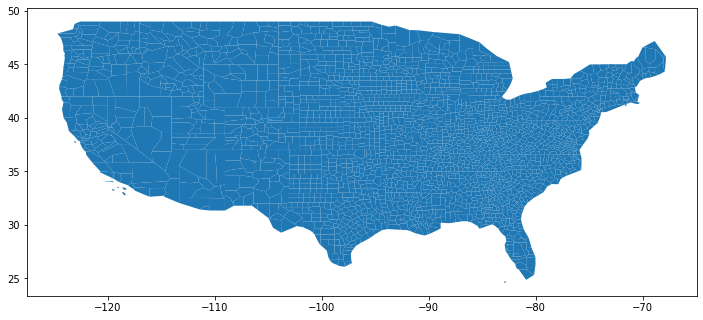

In [37]:
pci_df.plot(figsize=(12,12))

La inspección de los nombres de las columnas revela que la tabla está organizada alrededor de una fila por condado y con los años como columnas, junto con información sobre el registro en particular. Este formato es un ejemplo de un amplio conjunto de datos longitudinales . En los datos de formato amplio, cada columna representa un período de tiempo diferente, lo que significa que cada fila representa un conjunto de mediciones realizadas sobre la misma "entidad" a lo largo del tiempo (así como cualquier información de identificación única sobre esa entidad). Esto contrasta con un formato largo, donde cada fila describe una entidad en un momento específico. Los datos largos dan como resultado una duplicación significativa de registros y, en general, son peores para el almacenamiento de datos, particularmente en el caso geográfico. Sin embargo, los datos de formato largo son a veces un formato más útil cuando se manipulan y analizan datos, como analiza [ Wickham_2014 ] . No obstante, **al analizar las trayectorias , es decir, los caminos que toman las entidades a lo largo del tiempo, los datos amplios son más útiles, y los usaremos aquí.**

En estos datos, tenemos 3076 condados a lo largo de 49 años, así como 28 columnas adicionales que describen cada condado.

Como ejemplo, podemos ver los primeros años para el condado de Jackson, Mississippi (código de estado 28) a continuación:

In [23]:
pci_df.query('NAME == "Jackson" & STATEFP == "28"')


,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GeoFIPS,GeoName,Region,TableName,LineCode,Descriptio,Unit,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,index,IndustryCl,Descript_1,geometry
1417,28,059,00695753,28059,Jackson,Jackson County,06,H1,G4020,None,25060,None,A,1872035802,830366011,+30.4560045,-088.6251005,28059,"Jackson, MS",5,CAINC1,3,None,Dollars,2957,3121,3327,3939,4203,4547,5461,5927,6315,6619,6967,7752,8885,9965,9698,10034,10734,11672,11936,12747,13666,14729,15718,16740,18051,18711,19098,19371,20352,22839,22641,23393,23937,23919,25025,25739,28540,29197,35012,34026,33582,34223,34905,34586,34494,34905,35429,35890,36449,NaN,None,None,"POLYGON ((-88.82351 30.38205, -88.88453 30.677..."


## Desigualdad global ¶
Comenzamos nuestro examen de la desigualdad centrándonos en varias medidas globales de desigualdad de ingresos. Aquí, "global" significa que **la medida se refiere a la naturaleza general de la desigualdad dentro de la distribución del ingreso**. Es decir, estas medidas se centran en la **disparidad directa entre ricos y pobres, sin tener en cuenta dónde viven los ricos y los pobres**. Para este propósito, se encuentran disponibles *varias medidas clásicas de desigualdad.*

En términos generales, las medidas de desigualdad se centran en la **dispersión** presente en una distribución del ingreso. En el caso de la desigualdad regional o espacial, las distribuciones describen el ingreso promedio o per cápita para unidades espaciales, como para condados, secciones censales o regiones. Para los datos de nuestros condados de EE. UU., podemos visualizar la distribución de los ingresos per cápita durante el primer año en la muestra de la siguiente manera:

In [39]:
seaborn.__version__

'0.11.1'

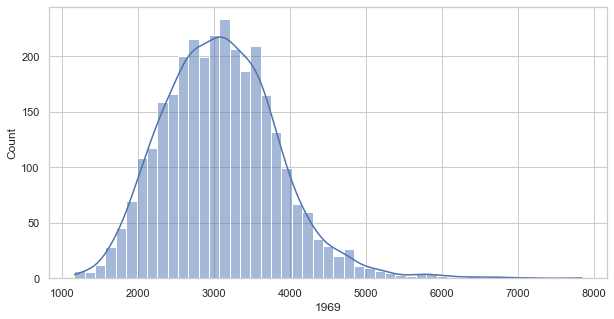

In [40]:
seaborn.set_theme(style='whitegrid')
seaborn.histplot(x=pci_df['1969'], kde=True);

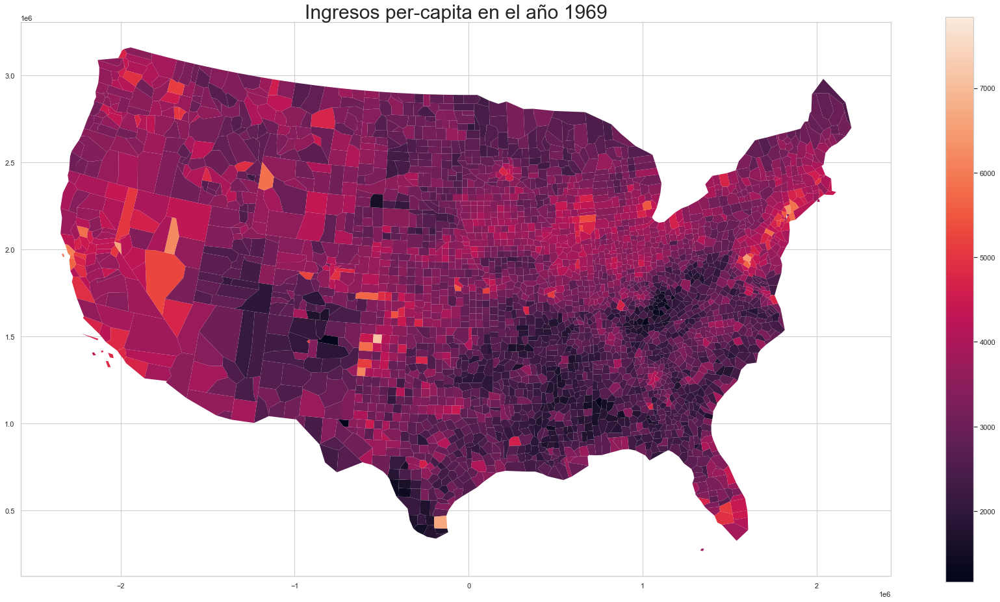

In [72]:
anno = 1969

pci_df.plot(figsize=(30,16), 
            column=str(anno),
            edgecolor='none',
            legend=True,
           )
plt.title('Ingresos per-capita en el año {anno}'.format(anno=str(anno)),
          fontsize=30);

Al observar esta distribución, observe que el lado derecho de la distribución es mucho más largo que el lado izquierdo. Esta larga cola derecha es una característica destacada y es común en el estudio de los ingresos y muchos otros fenómenos sociales, ya que refleja el hecho de que dentro de una única distribución de ingresos, los superricos son generalmente mucho más ricos que los superpobres en comparación con el promedio.

Un punto clave a tener en cuenta aquí es que la **unidad de medida en estos datos es un agregado espacial de los ingresos individuales**. Aquí, estamos usando los **ingresos per cápita de cada condado**. Por el contrario, en la literatura más amplia sobre desigualdad, la unidad de observación suele ser un hogar o un individuo. **En las últimas distribuciones, el grado de asimetría suele ser más pronunciado. Esta diferencia surge del suavizado que es intrínseco a la agregación**: las distribuciones regionales se basan en promedios obtenidos de las distribuciones individuales, por lo que los individuos de ingresos extremadamente altos se promedian con el resto de su condado. **El enfoque regional implica que, para evitar caer en la llamada "falacia ecológica", según la cual las conclusiones individuales se extraen de agregados geográficos, nuestras conclusiones se mantendrán a nivel de área (elcondado ) en lugar del individual (la persona ).**

La estimación de la densidad del kernel (o histograma) es un poderoso dispositivo de visualización que captura la morfología general de la distribución de características para esta medida de ingresos. Al mismo tiempo, la trama guarda silencio sobre la distribución geográfica subyacente de los ingresos del condado. Podemos mirar esta segunda vista de la distribución usando un mapa de coropletas. Para construir esto, podemos usar las geopandas herramientas de trazado estándar .

Antes de que podamos llegar al mapeo, notamos que los datos se expresan en longitud y latitud, pero esto no se registra pci_df. Configuramos el CRS explícitamente y luego lo cambiamos a uno más adecuado para el mapeo, la proyección Albers Equal Area para Norteamérica:

In [62]:
pci_df = (pci_df.set_crs(epsg=4326) # US Census default projection
                .to_crs(epsg=5070)) # Albers Equal Area North America

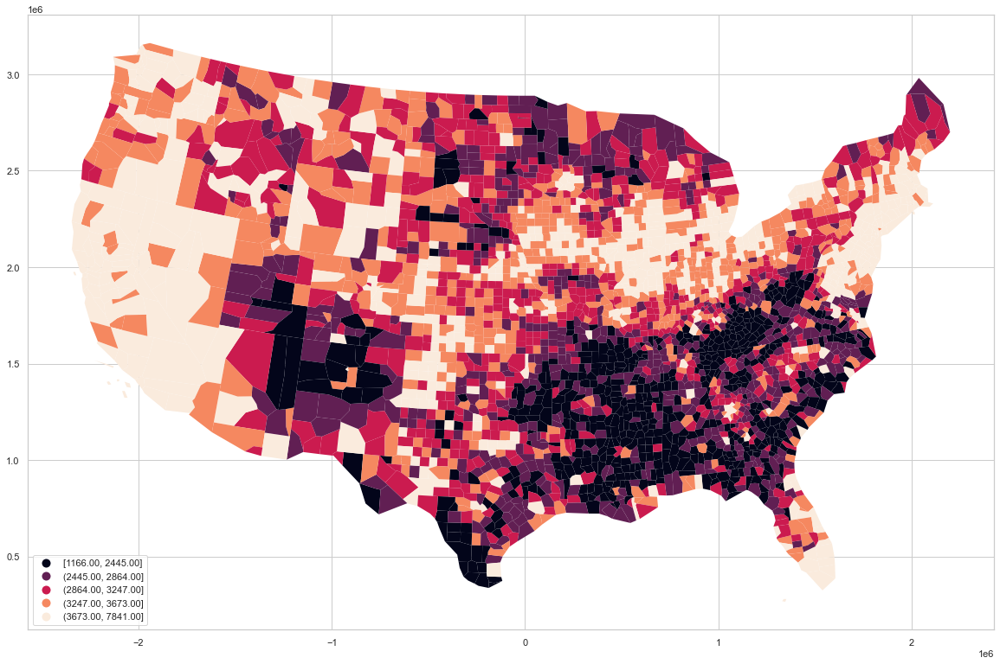

In [64]:
anno = 1969
pci_df.plot(
    column=str(anno), 
    scheme='Quantiles', #para pintar por cuantiles
    legend=True,        #mostrar leyenda
    edgecolor='none',   #sin color en bordes
    legend_kwds={'loc': 'lower left'}, 
    figsize=(20, 20)
)
plt.show()

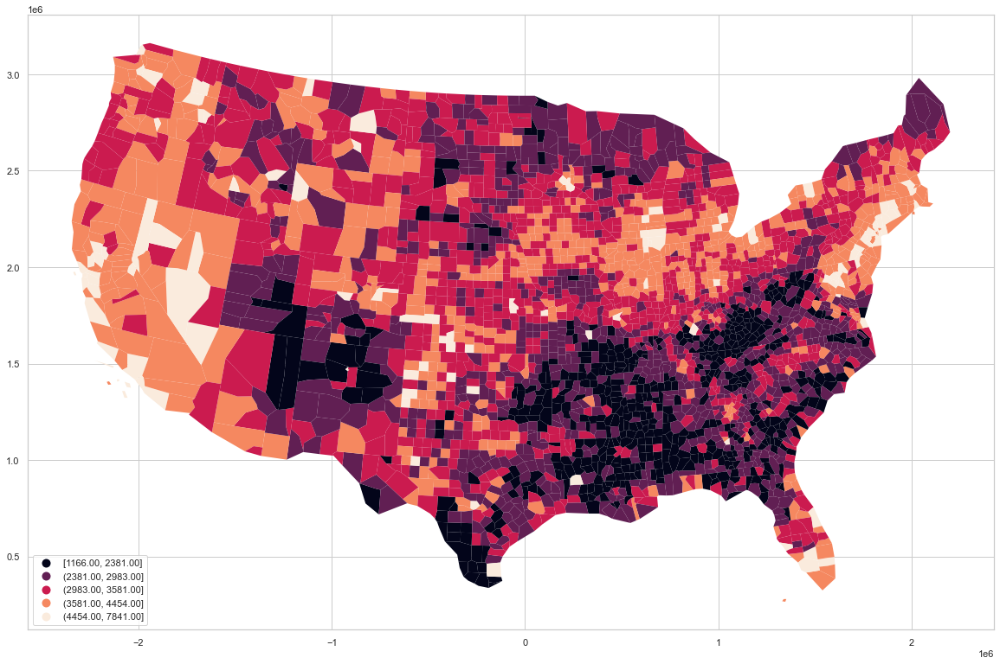

In [74]:
anno = 1969
pci_df.plot(
    column=str(anno), 
    scheme='NaturalBreaks', #para pintar por NauralBreaks
    legend=True,        #mostrar leyenda
    edgecolor='none',   #sin color en bordes
    legend_kwds={'loc': 'lower left'}, 
    figsize=(20, 20)
)
plt.show()

La coropleta y la densidad del núcleo proporcionan diferentes representaciones visuales de la distribución de los ingresos del condado. La estimación de la densidad del kernel es una representación basada en características y el mapa es una representación geográfica . Ambos son útiles para desarrollar una comprensión más completa. **Para obtener información sobre el nivel de desigualdad en la distribución, analizaremos algunos índices comunes en la literatura estadística y econométrica.**

### Relación 20:20

Una medida de desigualdad comúnmente utilizada en una distribución es la denominada relación 20:20, que se define como la relación de los ingresos en el percentil 80 sobre los del percentil 20:



In [76]:
top20, bottom20 = pci_df['1969'].quantile([.8, .2])

In [78]:
top20 / bottom20

1.5022494887525562

En 1969, el 20% más rico de los condados tenía un ingreso 1,5 veces mayor que el 20% más pobre de los condados. **La relación 20:20 tiene la ventaja de ser robusta a valores atípicos en la parte superior e inferior de la distribución**. 

Para observar la dinámica de esta medida de desigualdad global, una forma es crear una función que la calcule para un año determinado y aplicarla a todos los años de nuestra serie de tiempo:

In [79]:
def ineq_20_20(values):
    top20, bottom20 = values.quantile([.8, .2])
    return top20 / bottom20

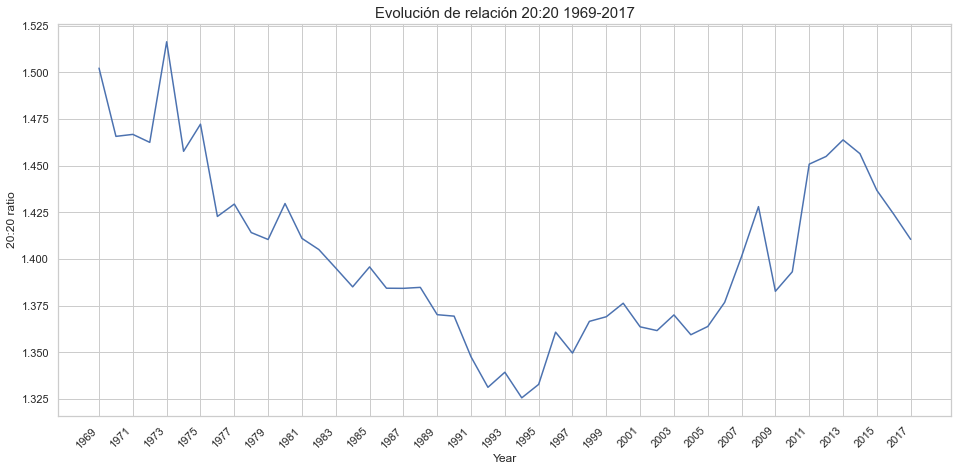

In [96]:
years = numpy.arange(1969, 2018).astype(str) #generamos años (variables)

ratio_2020 = pci_df[years].apply(ineq_20_20, axis=0) #aplicamos la función por cada año

plt.figure(figsize=(16,8))
ax = plt.plot(years, ratio_2020)
figure = plt.gcf()
plt.xticks(years[::2]) #mostrar solo años pares
plt.ylabel("20:20 ratio")
plt.xlabel("Year")
plt.title('Evolución de relación 20:20 1969-2017', fontsize=15)
figure.autofmt_xdate(rotation=45)
plt.show()

La evolución de la relación tiene un patrón en forma de U a lo largo del tiempo, tocando fondo alrededor de 1994 después de un largo descenso. Después de 1994, sin embargo, la proporción 20:20 indica que hay una creciente desigualdad hasta 2013, cuando hay un giro hacia una menor desigualdad de ingresos entre los condados.

Además de la relación 20/20, **exploraremos dos medidas más tradicionales de desigualdad: los índices de Gini y Theil**. Para estos, usaremos  inequality  del paquete pysal:

In [97]:
from pysal.explore import inequality

### Índice de Gini 

El índice de Gini es una medida de desigualdad de larga data basada en la **noción de distribución acumulativa de la riqueza**. Para construir una curva de Lorenz, la participación acumulada de riqueza se traza contra la participación de la población que posee esa riqueza. 

*Por ejemplo, en una sociedad extremadamente desigual donde pocas personas poseen casi toda la riqueza, la curva de Lorenz aumenta muy lentamente al principio, luego se dispara una vez que se incluye a las personas más ricas.*

*Por el contrario, una sociedad "perfectamente igualitaria" se vería como una línea recta que conecta (0,0) y (1,1). Esto se llama la línea de perfecta igualdad y representa el caso donde p% de la población posee exactamente p% de la riqueza. Por ejemplo, esto podría significar que el 50% de la población gana exactamente el 50% de los ingresos, o el 90% de la población posee el 90% de la riqueza.** 

La idea principal es que la parte de la riqueza o el ingreso es exactamente proporcional a la parte de la población que posee esa riqueza o gana esa renta, lo que ocurre solo cuando todos tienen los mismos ingresos o poseen la misma cantidad de riqueza.

**Con estas nociones en mente, podemos definir el índice de Gini como la razón del área entre la línea de perfecta igualdad y la curva de Lorenz para una determinada distribución del ingreso o la riqueza, estandarizada por el área bajo la línea de perfecta igualdad (que siempre es 12). Por tanto, el índice de Gini es una medida de la brecha entre una sociedad perfectamente igualitaria y la sociedad observada en todos los niveles de riqueza / ingresos.**

Podemos construir una de las curvas de Lorenz para 1969 calculando primero la proporción de nuestra población de condados que está por debajo de cada observación. Para eso, generamos una serie acumulativa:

In [103]:
n = len(pci_df)
share_of_population = numpy.arange(1, n+1) / n
share_of_population

array([3.25097529e-04, 6.50195059e-04, 9.75292588e-04, ...,
       9.99349805e-01, 9.99674902e-01, 1.00000000e+00])

Luego, consideramos la evolución acumulada de la renta. Para ello, necesitamos averiguar la proporción del ingreso total que posee cada parte de la población. Empíricamente, esto se puede calcular de la siguiente manera:

Primero, clasificamos los ingresos del condado:

In [106]:
incomes = pci_df['1969'].sort_values()
incomes

2647    1166
78      1242
2981    1244
1047    1253
973     1293
        ... 
1710    6630
2661    6670
2901    6830
2633    7111
1802    7841
Name: 1969, Length: 3076, dtype: int64

En segundo lugar, encontramos el porcentaje general de ingresos acumulados en cada punto de datos. 

Para hacer esto, calculamos qué porcentaje del ingreso total representa el de cada condado:

In [107]:
shares = incomes / incomes.sum()
shares

2647   0.000
78     0.000
2981   0.000
1047   0.000
973    0.000
        ... 
1710   0.001
2661   0.001
2901   0.001
2633   0.001
1802   0.001
Name: 1969, Length: 3076, dtype: float64

y construimos la suma acumulada de estas participaciones, que refleje la suma de todas las participaciones en los ingresos hasta la actual:

Esto comienza en 0 y alcanza 1 una vez incluida la última acción:

In [108]:
cumulative_share = shares.cumsum()
cumulative_share

2647   0.000
78     0.000
2981   0.000
1047   0.001
973    0.001
        ... 
1710   0.997
2661   0.998
2901   0.998
2633   0.999
1802   1.000
Name: 1969, Length: 3076, dtype: float64

Con esto, podemos trazar tanto la curva de Lorenz como la línea de perfecta igualdad:



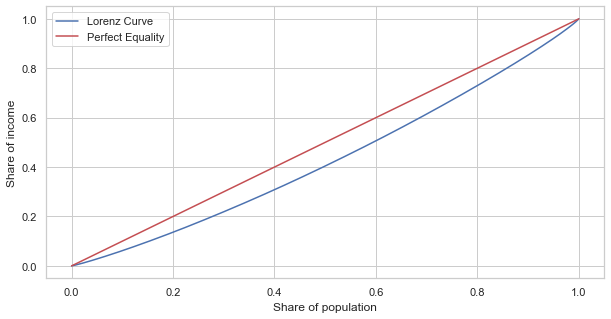

In [109]:
f, ax = plt.subplots()
ax.plot(share_of_population, cumulative_share, label='Lorenz Curve')
ax.plot((0,1), (0,1), color='r', label='Perfect Equality')
ax.set_xlabel('Share of population')
ax.set_ylabel('Share of income')
ax.legend()
plt.show()

La línea azul es la curva de Lorenz para los ingresos del condado en 1969. El índice de Gini es el área entre él y la línea de igualdad de 45 grados que se muestra en rojo, todos estandarizados por el área debajo de la línea de igualdad.

Un primer enfoque para examinar cómo ha evolucionado la desigualdad es trazar las curvas de Lorenz para cada año. Una forma de hacer esto en Python implica la creación de una función que calculará la curva de Lorenz para un conjunto arbitrario de ingresos. La siguiente función resume los pasos que se muestran arriba en una sola toma:

In [110]:
def lorenz(y):
    y = numpy.asarray(y)
    incomes = numpy.sort(y)
    income_shares = (incomes / incomes.sum()).cumsum()
    N = y.shape[0]
    pop_shares = numpy.arange(1, N+1)/N
    return pop_shares, income_shares

Podemos usar la misma estrategia anterior para calcular las curvas de Lorenz para todos los años en nuestros conjuntos de datos:



Prácticamente, esto se convierte en un marco de datos con columnas para cada año. Las filas contienen las participaciones de la población (o participaciones de los ingresos) como listas.



In [111]:
lorenz_curves = pci_df[years].apply(lorenz, axis=0)
lorenz_curves

,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,"[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553...","[0.00032509752925877764, 0.0006501950585175553..."
1,"[0.00012248644113964493, 0.0002529565611185806...","[0.00013470713147942766, 0.0002749742242147042...","[0.00013565871276465116, 0.0002735829350945102...","[0.000138851418132282, 0.0002856978062862818, ...","[0.00013772329900895125, 0.0002789403397482158...","[0.00013670247958589532, 0.0002822671421734887...","[0.00013545577965044458, 0.0002969630997663923...","[0.00013285409901160207, 0.0002894117453533050...","[0.0001243028615204895, 0.00025562579972132935...","[0.00012461982501385657, 0.0002617767612857009...","[0.0001240619562358738, 0.00024867473399875115...","[9.909708343859931e-05, 0.00022018503360042563...","[0.00013585651906530854, 0.0002799383173762335...","[0.00014205271222422544, 0.0002855916769595157...","[0.00013705218623774723, 0.0002769734198524521...","[0.00012533493451848406, 0.0002523235146698325...","[0.00010956253466903738, 0.0002369133177564938...","[0.00011629419594875927, 0.00024763545820502, ...","[0.00010917458730967311, 0.0002424266512337216...","[0.00011333374343921703, 0.0002515067825776752...","[0.00011057840264471089, 0.0002535411102106898...","[0.00011966353532794583, 0.0002732418451276596...","[0.00012896490937968572, 0.0002802628161807864...","[0.00

Al iterar sobre las columnas de este marco de datos, podemos hacer un gráfico de las curvas de Lorenz para cada año:

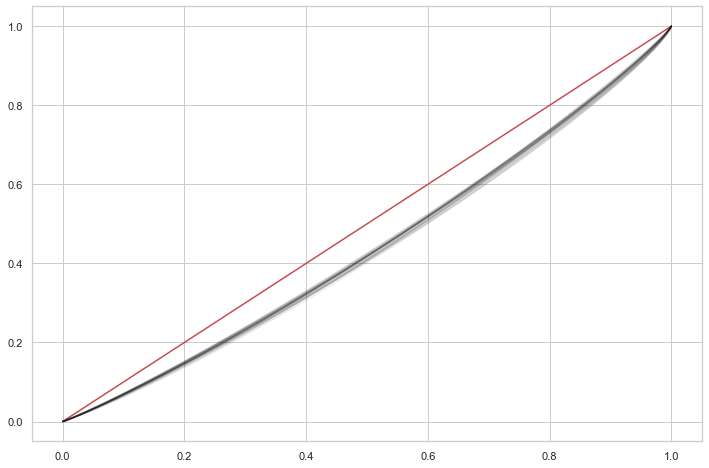

In [114]:
f, ax = plt.subplots(figsize=(12,8))
ax.plot((0,1),(0,1), color='r')
for year in lorenz_curves.columns:
    year_pop_shares, year_inc_shares = lorenz_curves[year].values
    ax.plot(year_pop_shares, year_inc_shares, color='k', alpha=.05)

La compresión de las curvas de Lorenz dificulta la determinación del patrón temporal en la desigualdad. Centrarse explícitamente en los coeficientes de Gini puede arrojar más luz sobre la evolución de la desigualdad a lo largo del tiempo.

Recuerde que el coeficiente de Gini representa el área entre la curva de Lorenz y la de perfecta igualdad. La medida se puede calcular directamente a través de la Giniclase en inequality. 

Para 1969, esto implica:

In [115]:
g69 = inequality.gini.Gini(pci_df['1969'].values)

Para extraer el coeficiente:

In [116]:
g69.g


0.13556175504269904

Aquí, el coeficiente de Gini en 1969 era 0,13. Para calcular esto para cada año, podemos usar un patrón similar al que teníamos antes. Primero, defina una función para calcular la cantidad de interés; luego, aplique la función en la tabla con todos los años:

In [117]:
def gini_by_col(column):
    return inequality.gini.Gini(column.values).g

El Gini de PySAL requiere un objeto en numpy.ndarray en lugar de un pandas Series; podemos extraer a través del atributo values. Esto se pasa a la clase Gini y solo devolvemos el valor del coeficiente.

In [119]:
inequalities = pci_df[years].apply(gini_by_col, axis=0).to_frame('gini')
inequalities

,gini
1969,0.136
1970,0.130
1971,0.129
1972,0.129
1973,0.142
1974,0.131
1975,0.131
1976,0.117
1977,0.117
1978,0.115


El patrón resultante es similar al de la relación 20:20 anterior:

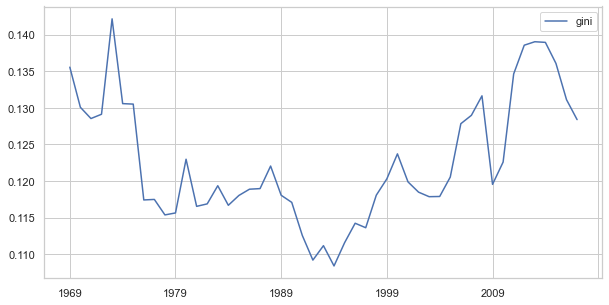

In [125]:
inequalities.plot();

### Índice de Theil 

Una tercera medida de desigualdad comúnmente utilizada es la de Theil T. Conceptualmente, esta métrica está relacionada con la entropía de la distribución del ingreso, midiendo cuán uniformemente distribuidos están los ingresos en la población.

El índice de Theil también está disponible en PySAL inequality, por lo que podemos adoptar un enfoque similar al anterior para calcularlo para cada año:

In [126]:
def theil(column):
    return inequality.theil.Theil(column.values).T

inequalities['theil'] = pci_df[years].apply(theil, axis=0)

Generamos una comparación visual de los dos índices generados

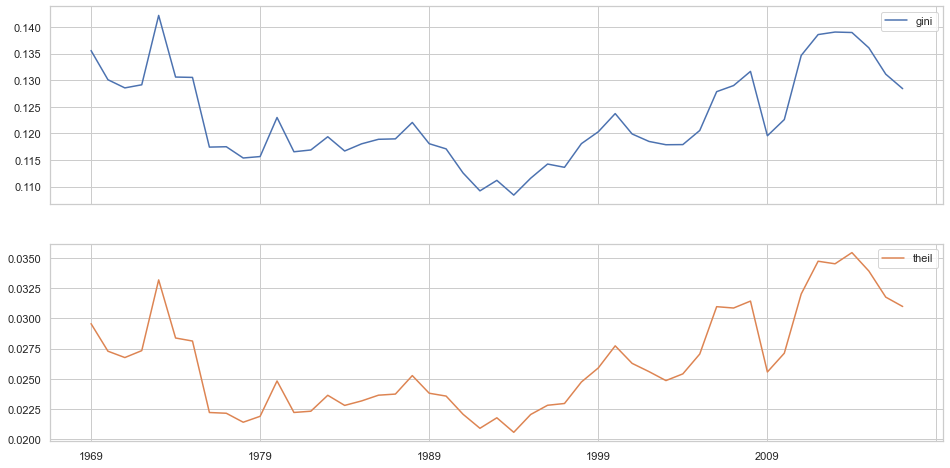

In [130]:
inequalities.plot(subplots=True, figsize=(16,8));

Las trayectorias temporales de los coeficientes de Gini y Theil muestran similitudes sorprendentes. A primera vista, esto podría sugerir que los índices se sustituyen entre sí. Sin embargo, no están perfectamente correlacionados:



Correlación: 0.9558163265306122


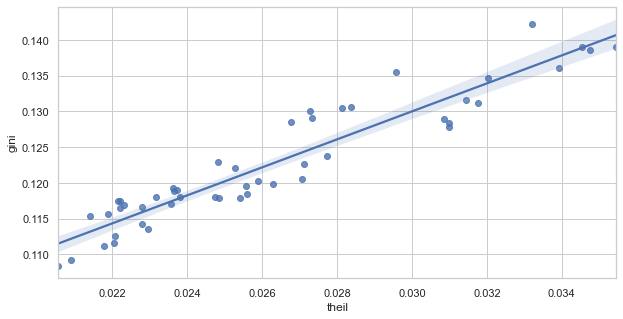

In [137]:
seaborn.regplot(x='theil', y='gini', data=inequalities)
print('Correlación:',inequalities.corr(method='spearman').iloc[0,1])

De hecho, como veremos más adelante, cada índice tiene propiedades que se prestan a extensiones espaciales particulares que funcionan de manera complementaria. Necesitamos ambos (y más) para tener una imagen completa.

## Desigualdad espacial 

El análisis de la desigualdad del ingreso regional difiere del análisis de la desigualdad del ingreso interpersonal nacional en su enfoque en las unidades espaciales. Dado que los ingresos regionales están explícitamente integrados en el espacio geográfico, podemos aprovechar su configuración espacial para aprender más sobre la naturaleza de la desigualdad. En la literatura sobre desigualdad regional, esto se ha abordado de varias maneras. 

En este capítulo se consideran tres: 

- uno que vincula la discusión con la de la autocorrelación espacial en los capítulos 6 y 7 ; 
- una segunda basada en la descomposición de índices globales por regiones; 
- y un tercero que integra el espacio en las medidas globales tradicionales.

### Autocorrelación espacial

In [138]:
from pysal.explore import esda
from pysal.lib import weights

Este enfoque nos ayuda a arrojar luz sobre las propiedades del patrón espacial de los datos de ingresos regionales. Volvemos a las medidas globales de autocorrelación espacial que encontramos anteriormente en el libro. La esencia de este enfoque es examinar hasta qué punto la distribución espacial de los ingresos se concentra en el espacio. Para esto, usamos una matriz de pesos espaciales de reina y calculamos el I de Moran para cada año en la muestra:

In [140]:
wq = weights.Queen.from_dataframe(pci_df) #Reina: espacios subyacentes

Siguiendo el mismo patrón para “transmitir” una función, creamos una función que devuelve los resultados que necesitamos de cada estadística. Aquí, también mantendremos el pseudo p-valor para el estadístico de Moran que, como vimos en el Capítulo 6 , nos ayuda a identificar si el índice es estadísticamente significativo bajo la hipótesis nula de que los ingresos están distribuidos geográficamente al azar.

In [141]:
def moran_by_col(y, w=wq):
    mo = esda.Moran(y, w=w)
    mo_s = pandas.Series(
        {"I": mo.I, "I-P value": mo.p_sim},
    )
    return mo_s

Esta vez, nuestra función devuelve un Serie sobjeto para que lo pasemos apply, obtenemos una tabla bien formateada:

In [143]:
moran_stats = pci_df[years].apply(moran_by_col, axis=0).T

In [144]:
moran_stats

,I,I-P value
1969,0.649,0.001
1970,0.647,0.001
1971,0.627,0.001
1972,0.607,0.001
1973,0.640,0.001
1974,0.627,0.001
1975,0.614,0.001
1976,0.606,0.001
1977,0.615,0.001
1978,0.610,0.001


Para una mayor comparación, los resultados se adjuntan a la inequalitiestabla:

In [145]:
inequalities = inequalities.join(moran_stats)

Para mostrar las interrelaciones generales entre estas estadísticas, hacemos otro gráfico a continuación:



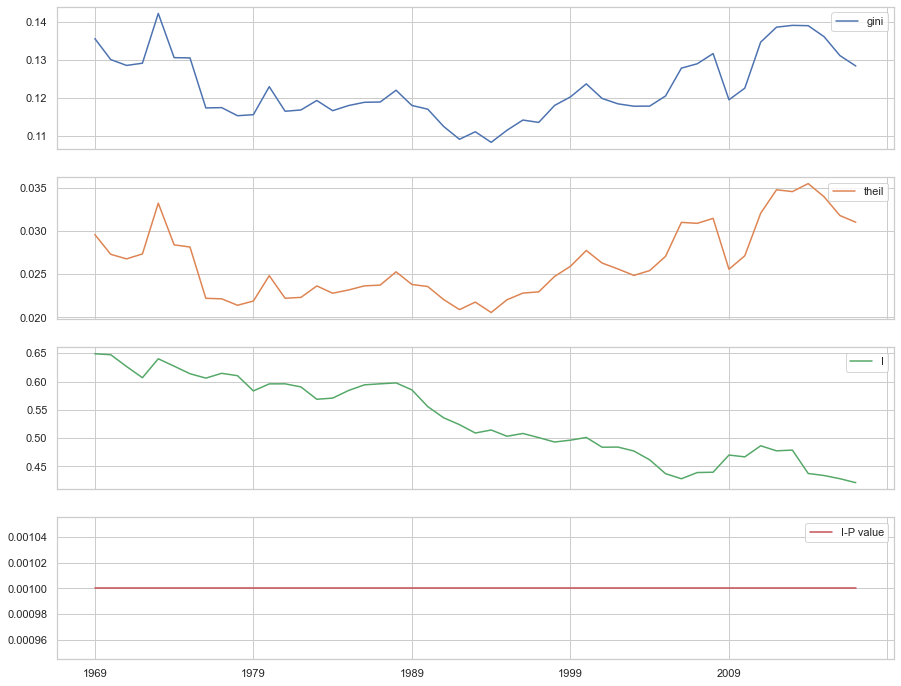

In [146]:
inequalities.plot(subplots=True, figsize=(15,12))
plt.show()

Varios patrones emergen de la serie temporal del I. de Moran. Antes de profundizar en los detalles, vale la pena señalar que, mientras Gini y Theil siguen un camino similar, el I de Moran muestra una trayectoria distinta. **Hay una disminución a largo plazo en el valor del I. de Moran.**

**Esto sugiere una disminución gradual en la estructura geográfica de la desigualdad con dos implicaciones:**

    a) los ingresos per cápita son ahora menos similares entre los condados cercanos y 

    b) esto ha sido en constante declive, independientemente de si la desigualdad es alta o baja. 

En segundo lugar, a pesar de esta disminución, **nunca hay un año en el que la autocorrelación espacial no sea estadísticamente significativa**. En otras palabras, **existe una sólida estructura geográfica en la distribución de los ingresos regionales** que debe tenerse en cuenta al centrarse en cuestiones de desigualdad.

### Descomposición regional de la desigualdad 

Una objeción común al análisis de la desigualdad en conjunto se relaciona con la falta de detalles sobre la escala en la que la desigualdad es más importante. La desigualdad puede ser impulsada por diferencias entre grupos y no por discrepancias en los ingresos entre individuos similares. Es decir, **siempre existe la posibilidad de que la desigualdad observada pueda "explicarse" por una variable de confusión, como la edad, el sexo o la educación**. Por ejemplo, las diferencias de ingresos entre las personas mayores y las jóvenes pueden “explicar” una gran parte de la desigualdad social en materia de riqueza: las personas mayores tienen mucho más tiempo para adquirir experiencia y, por lo tanto, generalmente se les paga más por esa experiencia. Las personas más jóvenes no tienen tanta experiencia, por lo que los jóvenes (en promedio) tienen ingresos más bajos que las personas mayores.

**Para combatir este problema, a menudo es útil descomponer los índices de desigualdad en grupos constituyentes**. Esto nos permite comprender qué parte de la desigualdad es impulsada por las diferencias de grupo agregadas y cuánto es impulsada por la desigualdad a nivel de observación. Esto también nos permite caracterizar cuán desigual es cada grupo por separado. En aplicaciones geográficas, estos grupos generalmente se definen espacialmente, en el sentido de que las regiones son grupos geográficos contiguos de observaciones. Esta sección analiza las descomposiciones regionales de la desigualdad como una forma de introducir la geografía en el estudio de la desigualdad.

Ilustremos estas ideas con nuestro conjunto de datos de ingresos. La tabla registra la región de la Oficina del Censo de los Estados Unidos a la que pertenece un condado en la variable Region . Estos dividen al país en ocho regiones, a cada una de las cuales se le asigna un número que se relaciona con su nombre, como se especifica a continuación:

In [147]:
region_names = {
    1:"New England",
    2: "Mideast",
    3: "Great Lakes",
    4: "Plains",
    5: "Southeast",
    6: "Southwest",
    7: "Rocky Mountain",
    8: "Far West"
}

Podemos visualizar las regiones con los nombres en la leyenda asignando primero el nombre a cada número de región y luego generando una coropleta cualitativa:

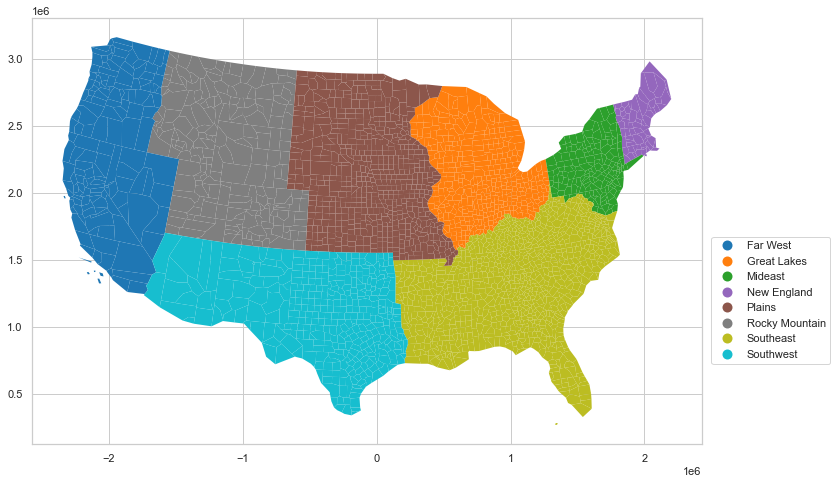

In [149]:
pci_df.assign(Region_Name=pci_df.Region.map(region_names))\
      .plot(
    "Region_Name",
    linewidth=0,
    legend=True,
    categorical=True,
    legend_kwds=dict(bbox_to_anchor=(1.2,.5)),
    figsize=(12,8)
);

Analicemos los cambios en los ingresos de cada región. Para hacer eso, podemos aplicar un patrón dividir-aplicar-combinar que agrupa los condados por región, calcula su media y la combina en una tabla:

In [151]:
rmeans = pci_df.assign(Region_Name=pci_df.Region.map(region_names))\
               .groupby(by='Region_Name')\
               .mean()\
               [years]
rmeans

,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Region_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Far West,4026.353,4282.727,4605.933,5058.587,5621.780,6265.167,6749.707,7185.207,7694.147,8605.840,9470.940,10532.080,11221.887,11520.893,12368.787,13251.380,13746.147,14433.907,14987.467,16041.233,17060.447,17718.220,18230.440,19147.767,19889.873,20381.320,21134.793,22342.573,23198.413,24353.260,25209.093,26916.340,27746.833,28015.767,29225.860,30630.160,31686.113,33372.873,35142.293,36279.187,35611.180,36680.900,38548.673,39962.253,40579.227,42877.700,45247.820,46248.953,47928.013
Great Lakes,3426.800,3575.078,3863.881,4199.541,4795.083,5156.716,5668.310,6146.046,6720.729,7398.936,8167.248,8731.833,9587.509,10109.835,10556.977,11798.362,12419.780,12985.122,13563.498,14214.541,15495.333,16129.709,16415.821,17636.787,18322.821,19369.732,19986.752,21161.784,22199.750,23264.741,24015.633,25286.440,26328.404,26568.096,27274.888,28498.560,28969.039,30214.867,31539.986,32971.138,32334.280,33621.401,35712.177,36784.635,37842.667,38810.310,39864.007,40735.773,41918.071
Mideast,3745.112,4003.944,4263.579,4608.360,5073.618,5534.669,5994.792,6485.730,7042.427,7773.331,8591.202,9533.421,10564.000,11365.629,12031.303,13182.910,14001.809,14808.511,15662.185,16882.938,18161.208,19006.461,19488.006,20498.011,21064.197,21739.281,22590.062,23608.534,24730.298,26009.213,27174.000,29018.028,30077.798,30522.051,31425.910,33151.101,34483.601,36005.961,37797.573,39298.062,38791.646,40084.056,41977.708,43304.949,43733.798,45401.174,47022.191,47930.287,49987.124
New England,3736.209,3984.612,4238.239,4567.478,4959.328,5338.358,5740.134,6333.537,6846.955,7585.776,8428.373,9489.313,10556.254,11442.642,12266.746,13525.030,14528.194,15550.433,16671.224,18050.866,19344.343,19726.179,20031.567,21103.642,21781.896,22690.090,23725.239,24818.582,26132.522,27768.134,29169.224,31428.701,33481.537,33934.090,34798.701,36588.522,37679.299,39962.358,41658.940,43129.701,42780.896,44309.119,46358.701,48058.731,48107.701,50086.672,52201.612,53493.806,55414.552
Plains,3185.181,3463.689,3748.909,4273.290,5462.900,5389.299,5774.113,5824.689,6299.960,7291.337,7961.696,8079.432,9587.746,10176.353,10463.163,11967.362,12414.037,12908.731,13497.950,13665.107,14849.701,15875.602,16035.969,17204.401,17448.883,18519.751,18617.838,20717.422,21003.147,22334.610,22912.526,24282.827,25442.076,25161.071,27478.227,28496.387,29645.367,30084.026,33267.136,36260.812,35053.728,36949.754,41725.170,43098.207,44535.634,44770.778,44949.201,44198.534,44367.510
Rocky Mountain,3320.837,3642.600,3869.986,4407.577,5147.102,5597.353,5814.698,6090.674,6506.419,7408.781,8017.456,9068.647,10102.209,10407.707,11002.330,11551.126,11854.135,12440.065,12854.102,13446.456,14794.321,15650.735,16246.660,17109.484,18210.753,18227.140,18935.898,19718.112,20597.070,21898.353,22849.953,23823.749,25524.284,25359.116,26529.642,27768.558,29511.433,30990.042,33485.391,34855.865,33196.893,34434.381,37304.758,39290.642,40389.247,42126.865,43665.419,43188.326,44321.233
Southeast,2611.550,2829.139,3062.238,3388.373,3833.672,4187.850,4487.303,4969.261,5389.129,6047.578,6696.327,7280.556,8163.664,8635.442,9106.475,10104.773,10609.333,11111.438,11687.390,12582.439,13521.527,14206.112,14791.097,15725.826,16316.900,17146.560,17849.576,18670.373,19507.474,20398.736,21041.535,22102.674,23078.749,23346.248,24144.119,25472.877,26621.948,27791.067,29000.043,30011.254,29590.113,30387.192,31792.254,32852.525,33231.091,34305.962,35476.280,36012.045,37209.982
Southwest,2968.305,3233.894,3443.859,3835.867,4486.610,4565.095,5182.435,5621.554,6045.093,6710.565,7827.151,8304.642,9799.318,10311.424,10714.332,11543.050,12110.870,12086.175,12429.424,12979.554,13700.286,14724.981,15014.523,15985.021,16700.005,16940.326,17297.419,17942.366,1

La tabla resultante tiene una fila para cada región y una columna para cada año. Podemos visualizar estos medios para tener una idea de su trayectoria temporal:

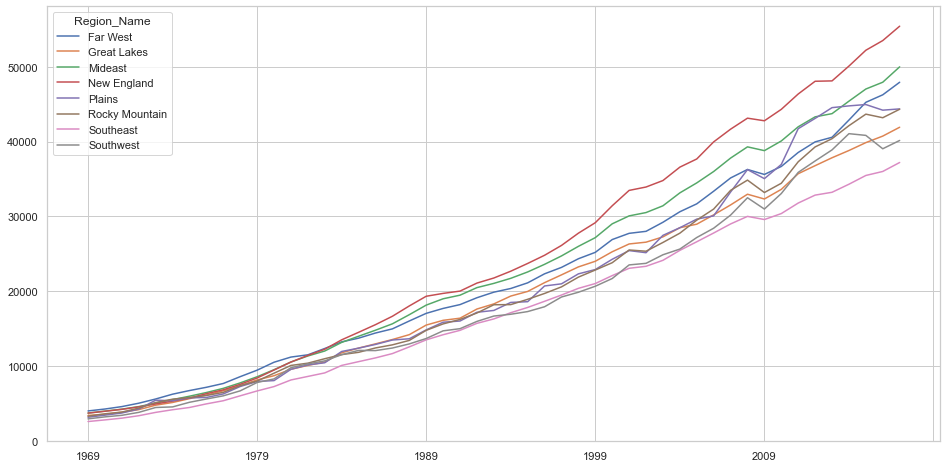

In [154]:
rmeans.T.plot.line(figsize=(16,8));

Una forma de introducir la geografía en el análisis de la desigualdad es utilizar delimitaciones geográficas para definir grupos de descomposición. 

Por ejemplo, Theil'sT, que encontramos anteriormente, se puede descomponer usando regiones en los llamados componentes intermedios y dentro de la desigualdad regional.

Una vez que hemos cubierto la descomposición conceptualmente, la implementación técnica es sencilla gracias al inequality módulo de PySAL, y la TheilD clase:

In [155]:
theil_dr = inequality.theil.TheilD(pci_df[years].values, pci_df.Region)

El theil_dr objeto tiene los componentes intermedios e internos almacenados en los atributos bgy wg. El bg representa el componente "entre" y "wg" para el componente interno. Por ejemplo, el componente "entre" para cada año que se calcula es:

In [156]:
theil_dr.bg

array([0.00914353, 0.00822696, 0.00782675, 0.00768201, 0.01022634,
       0.0081274 , 0.00783943, 0.00572543, 0.00560271, 0.0054971 ,
       0.00511791, 0.00566001, 0.00486877, 0.00466134, 0.00474425,
       0.00424528, 0.00428434, 0.00453503, 0.00465829, 0.00456699,
       0.00467363, 0.00412391, 0.00366334, 0.00342112, 0.00327131,
       0.00312475, 0.00326071, 0.00359733, 0.00327591, 0.00363014,
       0.00382409, 0.00436261, 0.00399156, 0.00402506, 0.00397   ,
       0.00394649, 0.00353368, 0.00362698, 0.00400508, 0.00449814,
       0.0043533 , 0.00470988, 0.0063954 , 0.00642426, 0.00694236,
       0.00644971, 0.00591871, 0.00554072, 0.00528702])

Si almacenamos estos componentes en nuestra tabla de resultados como lo hemos estado haciendo:



In [158]:
inequalities['theil_between'] = theil_dr.bg
inequalities['theil_within'] = theil_dr.wg
inequalities.drop('I-P value', axis=1, inplace=True)

Podemos visualizarlos junto con nuestros resultados anteriores:

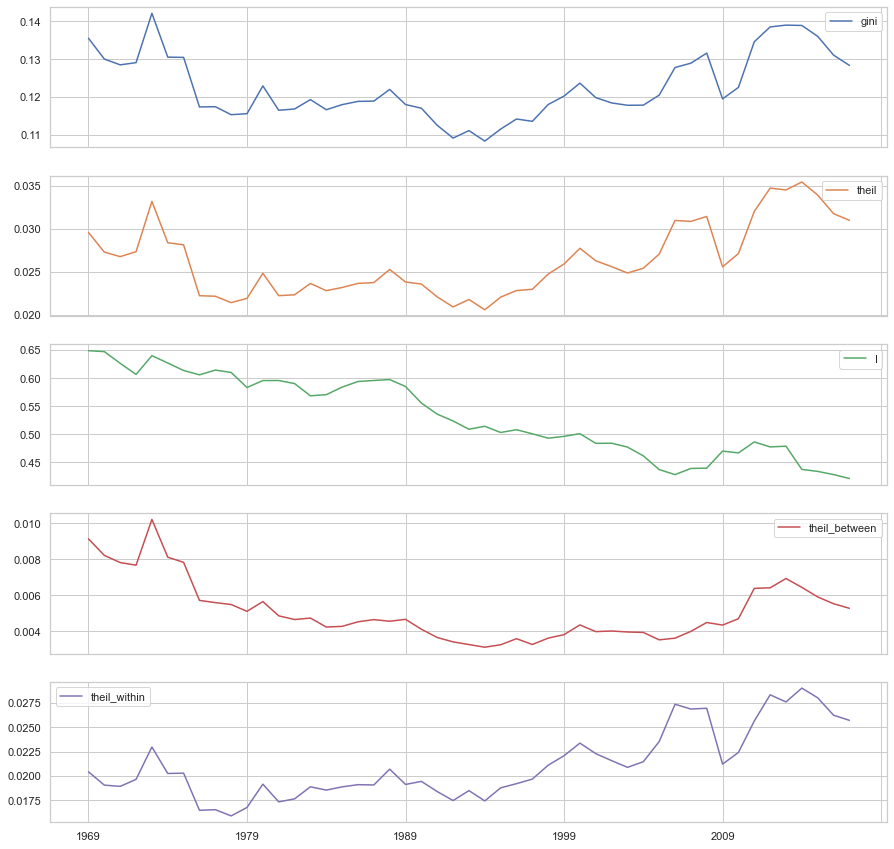

In [159]:
inequalities.plot(subplots=True, figsize=(15,15))
plt.show()

La inferencia sobre estas descomposiciones se puede hacer usando la clase inequality.theil.TheilDSim , pero lo omitimos aquí por brevedad e informamos que, como el de MoranI, todas las descomposiciones de Theil son estadísticamente significativas. Además, dado que los componentes internos y entre ellos se interpretan como participaciones del índice de Theil general, podemos calcular la participación del índice de Theil debido a la desigualdad entre regiones y observar que, en general, también comparte el mismo patrón, pero no ve mínimos en los mismos lugares:

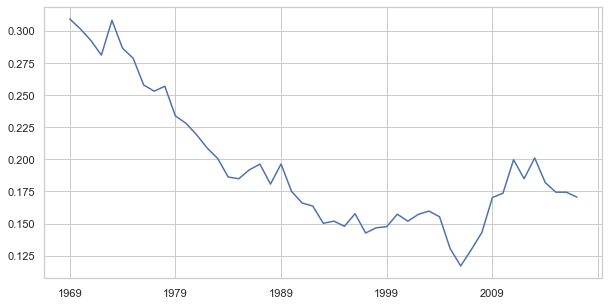

In [160]:
inequalities['theil_between_share'] = inequalities['theil_between'] / inequalities['theil']
inequalities['theil_between_share'].plot()
plt.show()

La proporción de desigualdad entre regiones alcanza su nivel más bajo a mediados de la década de 2000, no a mediados de la de 1990. Esto sugiere que las diferencias regionales fueron muy importantes en las décadas de 1970 y 1980, pero esta importancia ha ido disminuyendo, en relación con la desigualdad dentro de las regiones del censo de EE. UU.

## Espacialización de medidas clásicas 

Si bien las descomposiciones regionales son útiles, no cuentan toda la historia. De hecho, una "región" es simplemente un tipo especial de grupo; su “geografía” solo se manifiesta a través de la pertenencia a un grupo ( ¿el condado está “en” la región o no? ). Este tipo de pensamiento "basado en el lugar", aunque geográfico, no es necesariamente espacial . No incorpora las nociones de distancia o proximidad al estudio de la desigualdad. Las ubicaciones geográficas de las regiones podrían reorganizarse sin impacto, siempre que se mantenga la estructura de membresía del grupo. Si bien, posiblemente, cambiar las regiones significa que ya no son "regiones", los métodos estadísticos no serían diferentes.

**El enfoque final que revisamos aquí es una integración explícita del espacio dentro de la medida tradicional no espacial. En particular, consideramos una versión espacializada del coeficiente de Gini**, introducido por [ RS12 ] . El Gini espacial está diseñado para considerar el papel de la adyacencia espacial en una descomposición del Gini tradicional. 

El Gini espacial permite considerar la dependencia espacial en la desigualdad. Si la dependencia espacial es muy fuerte y positiva, los ingresos son muy similares entre las observaciones cercanas, por lo que la desigualdad de las diferencias "cercanas" será pequeña. La mayor parte de la desigualdad en la sociedad será impulsada por disparidades en los ingresos entre lugares distantes. Por el contrario, cuando la dependencia es muy débil (o incluso negativa), los dos componentes pueden igualarse. La inferencia sobre el Gini espacial puede basarse en permutaciones espaciales aleatorias de los valores de ingresos, como hemos visto en otra parte de este libro. Esto prueba si la distribución de los componentes es diferente de la obtenida cuando los ingresos se distribuyen aleatoriamente en el mapa.

El Gini espacial también proporciona un complemento útil a la descomposición regional utilizada en la estadística de Theil. Este último no considera las relaciones por pares entre las observaciones, mientras que el Gini espacial sí lo hace. Al considerar las relaciones por pares entre las observaciones, el coeficiente de Gini es más sensible y también puede verse afectado más fuertemente por pequeños grupos de observaciones significativamente ricas.

Podemos estimar coeficientes de Gini espaciales usando la clase Gini_Spatial:

In [165]:
#!pip install inequality

In [164]:
from inequality.gini import Gini_Spatial

Primero, dado que el Gini espacial requiere pesos espaciales binarios, nos aseguraremos de que esto sea así antes de continuar:

In [166]:
wq.transform = 'B'

Luego, el Gini espacial se puede calcular a partir de un vector de ingresos y los pesos espaciales que describen la adyacencia entre las observaciones.



In [167]:
gs69 = Gini_Spatial(pci_df['1969'], wq)

El Gini aspacial se almacena en el gatributo, al igual que para la clase aspacial:



In [168]:
gs69.g

0.13556175504269904

La participación del coeficiente de Gini general que se debe a las diferencias "lejanas" se almacena en la wcg_share (participación):

In [170]:
gs69.wcg_share

0.13541750749645268

La p-valor para esta prueba si el componente que mide la desigualdad entre vecinos es mayor (o menor) de lo que habría ocurrido si los ingresos se barajaran aleatoriamente alrededor del mapa:

In [173]:
gs69.p_sim

0.01

El valor es estadísticamente significativo para 1969, lo que indica que la desigualdad entre pares de condados vecinos es diferente de la desigualdad entre pares de condados que no son geográficamente próximos.

Podemos aplicar la misma estadística cada año en la muestra usando el enfoque de función por columna como antes. En este caso, queremos devolver la estadística en sí, así como la descomposición entre la variación en los vecinos y la de los no vecinos, y los pseudo valores P:

In [174]:
def gini_spatial_by_col(incomes, weights):
    gs = Gini_Spatial(incomes, weights)
    denom = 2 * incomes.mean() * weights.n**2
    near_diffs = gs.wg / denom
    far_diffs = gs.wcg / denom
    out = pandas.Series(
        {
            "gini": gs.g,
            "near_diffs": near_diffs,
            "far_diffs": far_diffs,
            "p_sim": gs.p_sim
        }
    )
    return out

La inferencia en este estimador es computacionalmente exigente, ya que las diferencias entre pares deben volver a calcularse en cada permutación, por lo que la siguiente celda tarda algo de tiempo en completarse la ejecución:

In [175]:
%%time
spatial_gini_results = pci_df[years].apply(gini_spatial_by_col, weights=wq).T

Wall time: 1min 48s


In [176]:
spatial_gini_results.head()

,gini,near_diffs,far_diffs,p_sim
1969,0.136,0.000,0.135,0.010
1970,0.130,0.000,0.130,0.010
1971,0.129,0.000,0.128,0.010
1972,0.129,0.000,0.129,0.010
1973,0.142,0.000,0.142,0.010


La p-los valores son siempre pequeños, lo que sugiere que la contribución de los vínculos locales es siempre menor que la que se esperaría si los ingresos se distribuyeran al azar en el mapa. Si bien es posible que el componente de "diferencias cercanas" sea mayor de lo esperado , eso implicaría una dependencia espacial negativa, que generalmente es poco común en el trabajo empírico. Podemos calcular el porcentaje de veces el p-valor es menor que un umbral usando la media:

In [177]:
(spatial_gini_results.p_sim < 0.05).mean()

1.0

Si bien puede parecer que el componente debido a "diferencias cercanas" es bastante pequeño, esto tiene dos razones. Primero, el número de pares "cercanos" es menos del 1% de todos los pares de observaciones:



In [178]:
wq.pct_nonzero

0.19385366975502275

En segundo lugar, cuando la dependencia espacial es alta, las observaciones cercanas serán similares. Por lo tanto, cada "diferencia cercana" también será pequeña. La suma de una pequeña cantidad de pequeñas observaciones generalmente será pequeña, en relación con las grandes diferencias entre observaciones distantes. Por lo tanto, los valores pequeños de las distancias "cercanas" son indicativos de dependencia espacial. **De hecho, podemos ver que a medida que la dependencia espacial se debilita, near_diffs se hace más grande:**

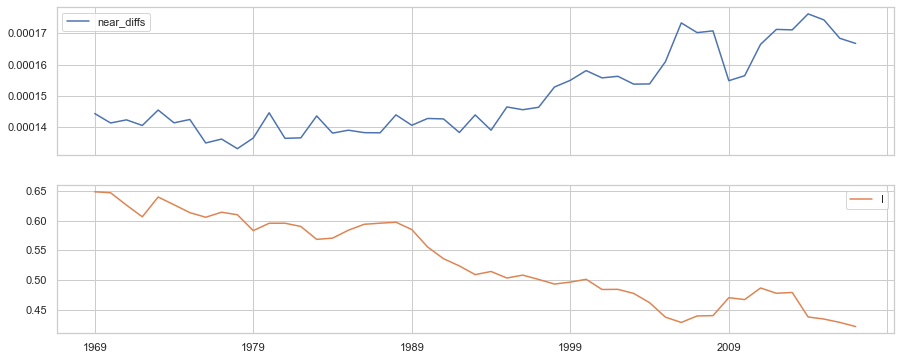

In [181]:
inequalities['near_diffs'] = spatial_gini_results.near_diffs

inequalities[['near_diffs', 'I']].plot.line(subplots=True, figsize=(15,6));

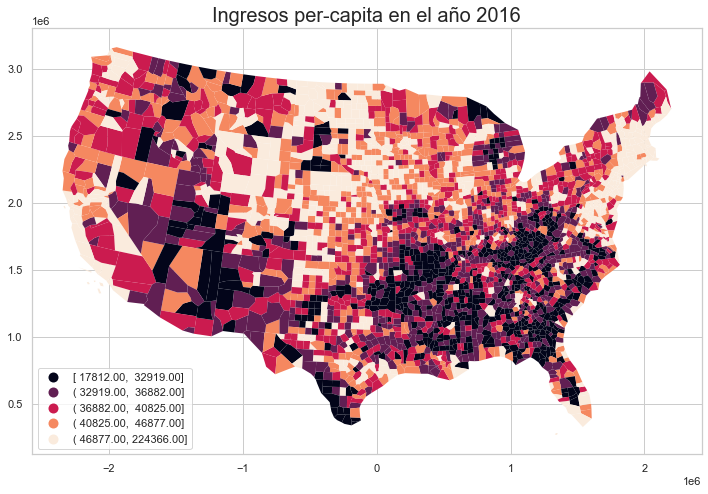

In [193]:
anno = 2016

pci_df.plot(    
    column=str(anno),
    figsize=(12,8), 
    scheme='Quantiles', #para pintar por NauralBreaks
    legend=True,        #mostrar leyenda
    edgecolor='none',   #sin color en bordes
    legend_kwds={'loc': 'lower left'}, 
           )
plt.title('Ingresos per-capita en el año {anno}'.format(anno=str(anno)),
          fontsize=20);

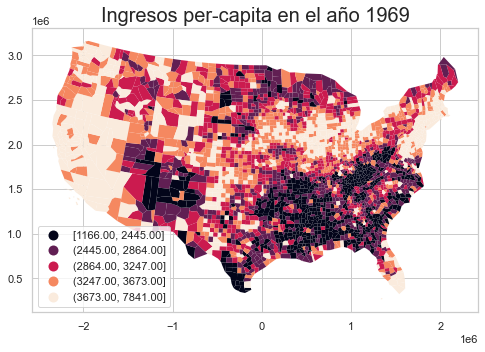

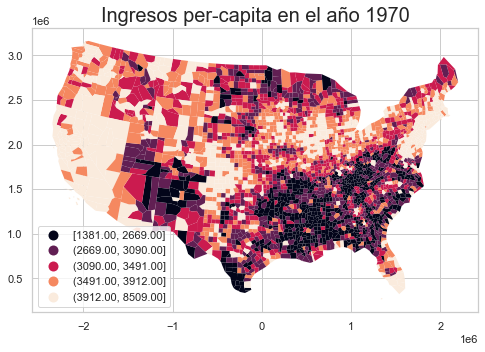

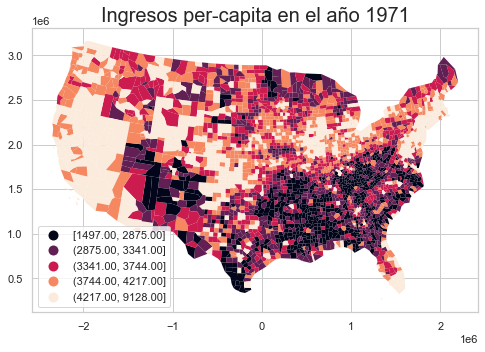

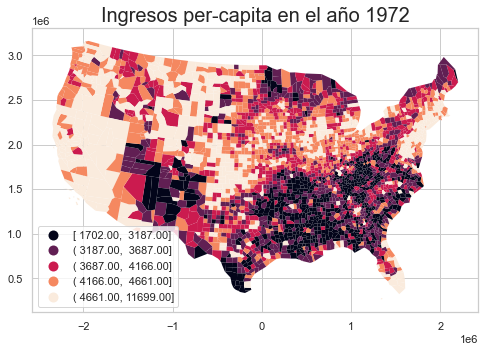

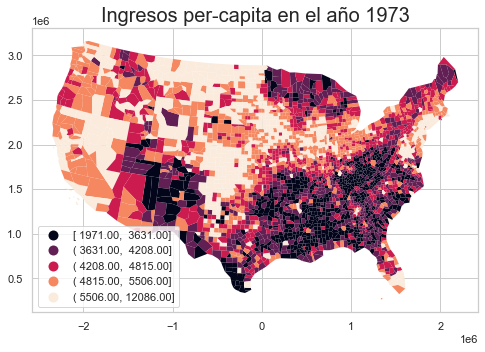

...

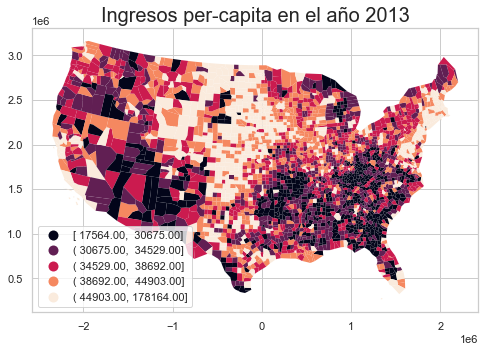

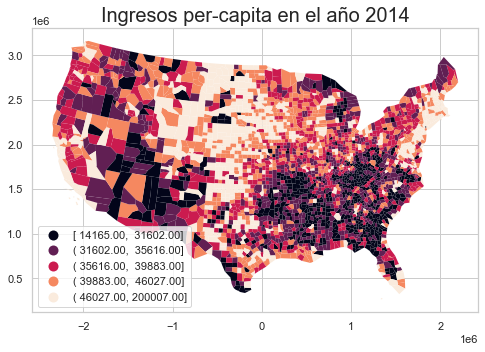

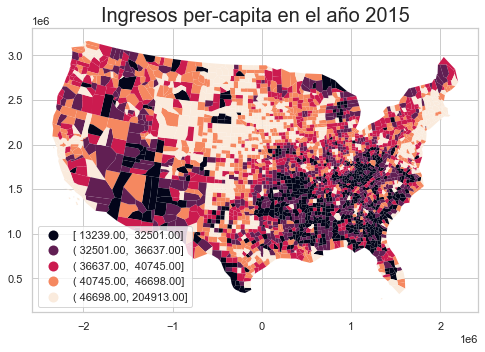

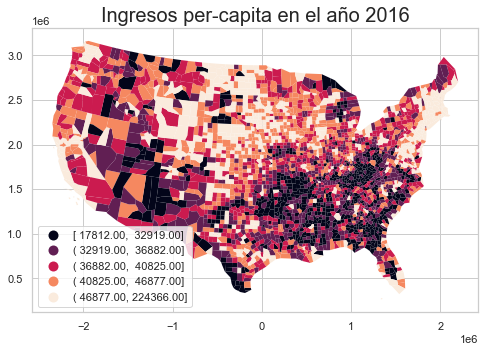

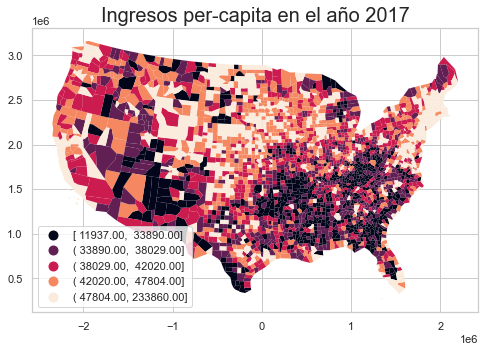

In [192]:
for anno in years:
    pci_df.plot(    
        column=str(anno),
        figsize=(8,6), 
        scheme='Quantiles', #para pintar por NauralBreaks
        legend=True,        #mostrar leyenda
        edgecolor='none',   #sin color en bordes
        legend_kwds={'loc': 'lower left'}, 
               )
    plt.title('Ingresos per-capita en el año {anno}'.format(anno=str(anno)),
              fontsize=20);
    plt.show()

## Conclusión 

La desigualdad es un fenómeno social importante y su geografía es una preocupación importante para los científicos sociales. **Se ha señalado a las disparidades geográficas en el bienestar como uno de los principales impulsores del auge de los movimientos populistas de derecha en Estados Unidos y Europa**. Por lo tanto, comprender la naturaleza de estas disparidades y su evolución es un desafío tanto para la ciencia como para las políticas.

Este capítulo analiza los **métodos para evaluar la desigualdad y examina su estructura espacial y regional**. Hemos visto el coeficiente de Gini y el índice de Theil como ejemplos de medidas globales para resumir el nivel general de desigualdad. Como suele ser el caso en muchas áreas del análisis espacial, la adopción directa de métodos de la economía y la sociología a los datos espaciales a menudo puede ser fructífera pero, al mismo tiempo, puede pasar por alto elementos clave de la historia espacial. En el contexto de las disparidades de ingresos espaciales, hemos destacado las **diferencias entre la desigualdad personal y regional**. Desde esta perspectiva, **hemos revisado tres enfoques para incorporar la geografía y el espacio en el estudio de la desigualdad**. En conjunto, esto nos da una buena idea de cómo la desigualdad se manifiesta geográficamente y cómo es (posiblemente) distinta de otros tipos de medidas espaciales.6 y 7 .

Antes de dejar el tema de la desigualdad espacial, observamos que se puede decir mucho más sobre la desigualdad y los conceptos relacionados. La desigualdad generalmente se refiere a la instantánea estática de la distribución regional del ingreso y las participaciones de esa distribución que tiene cada región. Esas acciones se reflejan en la variación o el margen de la distribución. Sin embargo, este es solo un momento de la distribución, y una comprensión integral de las disparidades requiere un análisis de la ubicación (media) y la forma de la distribución (modos, curtosis, asimetría), así como la dispersión. Además, **los movimientos de regiones individuales dentro de la distribución a lo largo del tiempo, o lo que se conoce como movilidad espacial de ingresos son fundamentales para nuestra comprensión de la dinámica de las disparidades espaciales**. La consideración completa de estos conceptos está más allá del alcance de este capítulo. Se dirige a los lectores interesados a 'Spatial dynamics and space-time data analysis' de 'Handbook of Regional Science' como punto de entrada a estos temas más avanzados.